## Описание проекта

Заказчик проекта - «Бета-Банк».

«Бета-Банк» столкнулся с проблемой оттока клиентов. Ежемесячно наблюдается постоянный и достаточно значимый уровень оттока.

По ценкам демартамента  маркетинга банка стоимость сохранения текущих клиентов дешевле, чем привлечения новых.

Результатом проекта является модель способная спрогнозировать уйдёт клиент из банка в ближайшее время или нет. 

Для построениея модели будут использоваться исторические данные о поведении клиентов и расторжении договоров с банком.

Целевая модель должна соотвествовать следующим критериям качества:

- F1-меры должная быть не менее 0.59. 

### Описание структуры данных

Признаки

- RowNumber — индекс строки в данных
- CustomerId — уникальный идентификатор клиента
- Surname — фамилия
- CreditScore — кредитный рейтинг
- Geography — страна проживания
- Gender — пол
- Age — возраст
- Tenure — сколько лет человек является клиентом банка
- Balance — баланс на счёте
- NumOfProducts — количество продуктов банка, используемых клиентом
- HasCrCard — наличие кредитной карты
- IsActiveMember — активность клиента
- EstimatedSalary — предполагаемая зарплата

Целевой признак

- Exited — факт ухода клиента

In [1]:
#!conda install -y -c glemaitre imbalanced-learn
# this is for install in yandex jupyter enviroment 

## Сыылка на публичный репозиторий проекта

https://github.com/emaximen/git_project_pub

## Используемые библиотеки

In [2]:
import pandas as pd
import numpy as np

from os.path import isdir

import plotly.graph_objs as go
import plotly.express as px
import plotly.offline as po
import plotly.figure_factory as ff

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import CondensedNearestNeighbour

from sklearn.utils import shuffle

from sklearn.dummy import DummyClassifier

from sklearn.metrics import roc_auc_score, roc_curve, auc

In [3]:
# !pip install imblearn
# for local installation

In [4]:
import warnings
warnings.filterwarnings("ignore")

## Подготовка данных

На данном этапе будут выполнены слоедущие задачи:

- Загрузка данных
- Оценка количественных и структурных характеристик данных:
  - размерность 
  - наличие пропусков
  - наличие дубликатов
  - корректность используемых типов данных

In [5]:
input_file = 'Churn.csv'

In [6]:
try:
    input_data = "data/{input_file}".format(input_file = input_file)
    df = pd.read_csv(input_data)
except:
    input_data = "/datasets/{input_file}".format(input_file = input_file)
    df = pd.read_csv(input_data)

In [7]:
# input_data = 'data/Churn.csv'
#input_data = '/datasets/Churn.csv'

In [8]:
#df = pd.read_csv(input_data)

Данные загрузились штатно, со стандартными параметрами, проблем при чтении не обнаружено

In [9]:
df.shape

(10000, 14)

В данных присутствует:
- 14 признаков, что соотвествует проектному заданию
- 10000 экземпляров

In [10]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2.0,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1.0,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8.0,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1.0,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2.0,125510.82,1,1,1,79084.10,0


<div class="alert alert-success">
<h2> Комментарий ревьюера ✔️ <a class="tocSkip"> </h2>

Хоть с данными и все ок, первичный анализ важен для любого проекта! Вообще, хорошо бы иметь у себя в арсенале функцию, которая выдавала бы всю информацию о датафрейме, знакомила бы нас с ним. В нее можно включить все основные методы типа `head`, `info` и т.д.  Можно графики строить какие-нибудь... Из готового, я бы рекомендовал почитать про [pandas_profiling](https://habr.com/ru/company/ruvds/blog/451478/?)


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           9091 non-null   float64
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 1.1+ MB


In [12]:
df.isnull().sum()

RowNumber            0
CustomerId           0
Surname              0
CreditScore          0
Geography            0
Gender               0
Age                  0
Tenure             909
Balance              0
NumOfProducts        0
HasCrCard            0
IsActiveMember       0
EstimatedSalary      0
Exited               0
dtype: int64

In [13]:
df.dtypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure             float64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

In [14]:
df['Tenure'].unique()

array([ 2.,  1.,  8.,  7.,  4.,  6.,  3., 10.,  5.,  9.,  0., nan])

В результате оценки имеющихся столбцов заметим следущее:

1. Столбец `Tenure`:
   - есть пропуски
   - `float64` видимо не соотвествует используемым знеачениям: заменим на `int64`
   
2. Столбец `RowNumber`
   - не очевидна полезность данного стообца для дальнейшего анализа, искоючим его из набора данных
   
3. Столбец `CustomerId`
   - не очевидна полезность данного стообца для дальнейшего анализа, искоючим его из набора данных
   
4. Столбец `Surname`
   - не очевидна полезность данного стообца для дальнейшего анализа, искоючим его из набора данных

Заполним пропущенные значения для столбцы `Tenure` по следущему алгоритму:

1. Выполним группировку записей без пропусков по столбцам `Geography` и `Gender`
2. Определим наиболее частые значения столбца `Tenure` для каждой группирповки (наиболее частое значение для каждой группировки)
3. Заполним пропупски используя информацию из п2 и на основе значений столбцов `Geography` и `Gender` в записях с пропусками

Делаем группировку

In [15]:
df_tmp = df[~df['Tenure'].isna()]

In [16]:
tenure_grp = pd.Series(df_tmp.groupby(by=['Geography', 'Gender'])['Tenure'])

Создаём словарь по каждой категории и самым частым значением `Tenure` для категории

In [17]:
category_dct = {}

for _, value_item in enumerate(tenure_grp):
    # value_item - tuple(0 - category, 1 - series with Tenure values)
    key = str(value_item[0]).strip(')').strip('(')
    category_dct[key] = value_item[1].value_counts().idxmax()

In [18]:
category_dct

{"'France', 'Female'": 3.0,
 "'France', 'Male'": 7.0,
 "'Germany', 'Female'": 1.0,
 "'Germany', 'Male'": 9.0,
 "'Spain', 'Female'": 5.0,
 "'Spain', 'Male'": 8.0}

Заполним пропуски в `Tenure`

In [19]:
def fill_tenure(row):
    key = "'{geo}', '{gender}'".format(geo=row['Geography'], gender=row['Gender'])
    
    if row['Tenure'] != row['Tenure']:
        return category_dct.get(key, -1)
    
    return row['Tenure']

In [20]:
df['Tenure'] = df.apply(fill_tenure, axis=1)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  float64
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 1.1+ MB


In [22]:
len(df[df['Tenure'] == -1])

0

Поменяем тип данных столбца `Tunure`

In [23]:
df['Tenure'] = df['Tenure'].astype('int64')

In [24]:
df.dtypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

Посмотрим что с дубликатами

In [25]:
df.duplicated().sum()

0

Дубликатов не обнаружено - можем удалять стообцы

In [26]:
data = df.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1)

In [27]:
data.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'Exited'],
      dtype='object')

In [28]:
data.duplicated().sum()

0

### Промежуточные итоги: подготовка данных

- Данные загрузились штатно, со стандартными параметрами, проблем при чтении не обнаружено.

- При первичном исследовании данных обнаружиди следущие проблемы:
 
  - Столбец `Tenure`:
    - есть пропуски (заполгили наиболее частыми значениями для групп `Geography` & `Gender`)
    - `float64` видимо не соотвествует используемым знеачениям: заменили на `int64`
    
    
- Также удалили следущие столбцы как безперспективные для нашей задачи:    
1. Столбец `RowNumber`
   - не очевидна полезность данного стообца для дальнейшего анализа, искоючим его из набора данных
   
2. Столбец `CustomerId`
   - не очевидна полезность данного стообца для дальнейшего анализа, искоючим его из набора данных
   
3. Столбец `Surname`
   - не очевидна полезность данного стообца для дальнейшего анализа, искоючим его из набора данных
   
- Не обнаружено прямых дубликатов до и после удаления стообцов

## Исследование данных

На данном шаге мы выполним исследование данных:
- Оценим баланс классов
- Изученый качественные свойства данных 

Посмотрим на балансировку для целевого признака

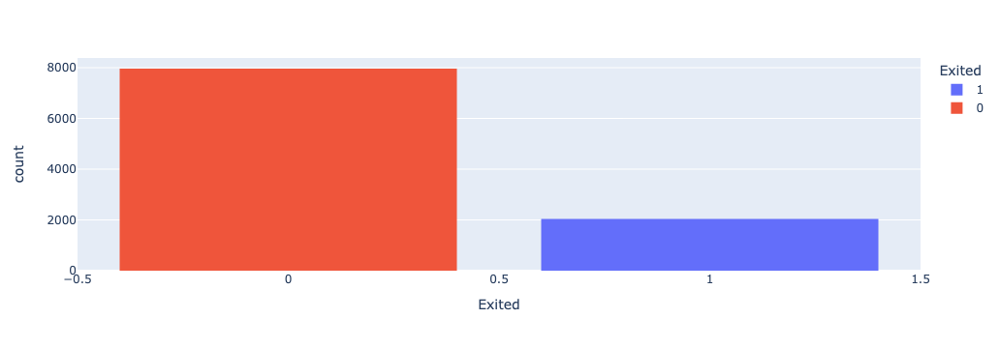

In [29]:
fig = px.histogram(data, x='Exited', color='Exited')
fig.update_layout(bargap=0.2)

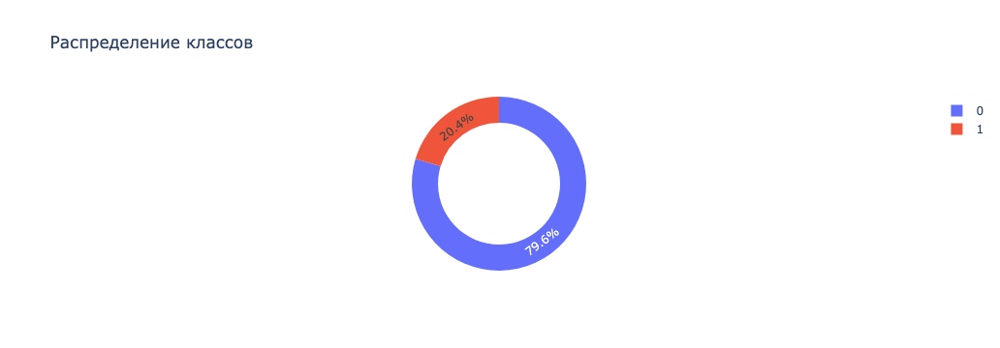

In [30]:
plot_labels = data['Exited'].value_counts().keys().tolist()
plot_values = data['Exited'].value_counts().values.tolist()

plot_data = [
    go.Pie(labels=plot_labels,
        values=plot_values,
        hole=.7)
    ]

plot_layout = go.Layout(dict(title="Распределение классов"))

fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [31]:
data['Exited'].value_counts()

0    7963
1    2037
Name: Exited, dtype: int64

Наблюдается серьёзный дисбаланс между классами в пользу класса `0`

Посмотрим на категориальные признаки

In [32]:
data.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'Exited'],
      dtype='object')

In [33]:
categorical_features = ['Geography',
                        'Gender',
                        'NumOfProducts',
                        'HasCrCard',
                        'IsActiveMember'
                       ]

Geography  : 
France     5014
Germany    2509
Spain      2477
Name: Geography, dtype: int64


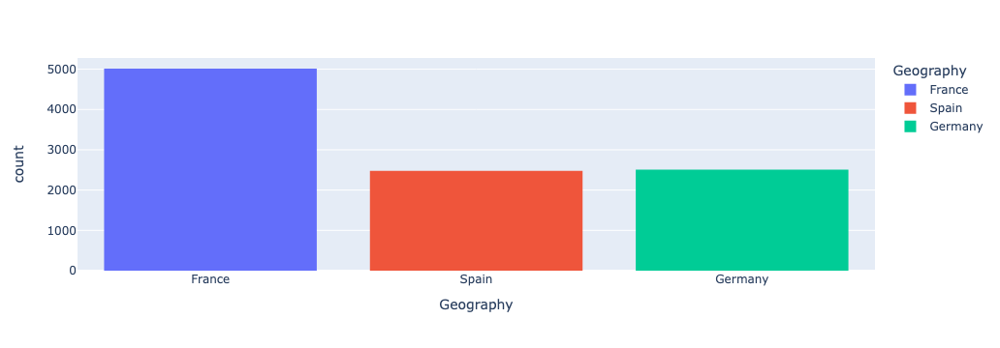

Gender  : 
Male      5457
Female    4543
Name: Gender, dtype: int64


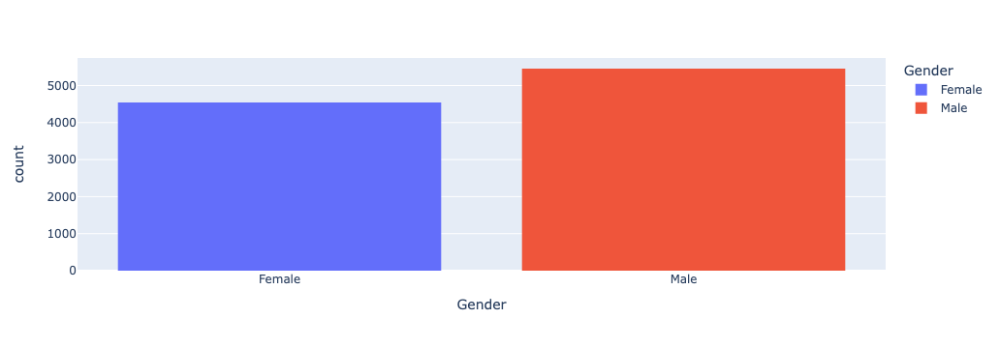

NumOfProducts  : 
1    5084
2    4590
3     266
4      60
Name: NumOfProducts, dtype: int64


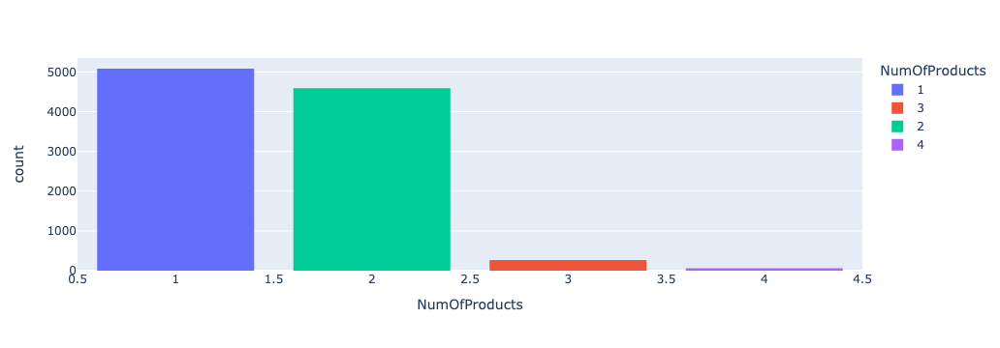

HasCrCard  : 
1    7055
0    2945
Name: HasCrCard, dtype: int64


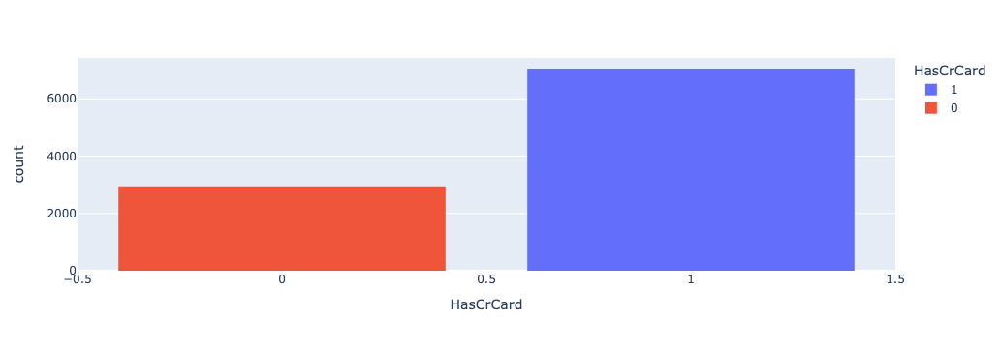

IsActiveMember  : 
1    5151
0    4849
Name: IsActiveMember, dtype: int64


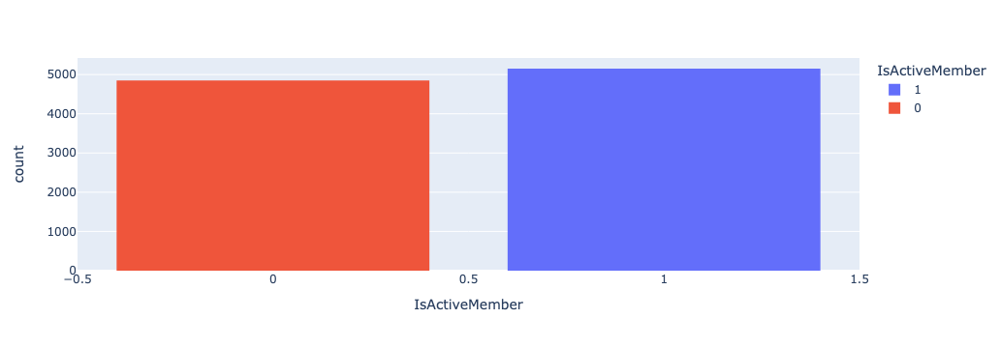

In [34]:
for cat in categorical_features:
    print(cat," : ")
    print(data[cat].value_counts())
    fig = px.histogram(data, x=cat, color=cat)
    fig.update_layout(bargap=0.2)
    fig.show()

Из гистограм категориальных признаков можем заметить следущее:
- Данные столбца `Geography` для значения `France` почти в 2 раза привышают остальные значения.
- В столбце `NumOfProducts` значения `3` и `4` практически не представлены. Количество данных для значений `1` и `2` на порядок превышает соличество данных для `3` и `4`.
- В стообце `HasCrCard` количество данных для значения `1` почти в 2 раза превышает количество данных для знаяения `0`.

Изучим свойства вещественных признаков

In [35]:
real_features = ['CreditScore',
                 'Age',
                 'Tenure',
                 'Balance',
                 'EstimatedSalary',
                ]

France CreditScore  : 
count    5014.000000
mean      649.668329
std        97.016799
min       350.000000
25%       582.000000
50%       653.000000
75%       717.000000
max       850.000000
Name: CreditScore, dtype: float64


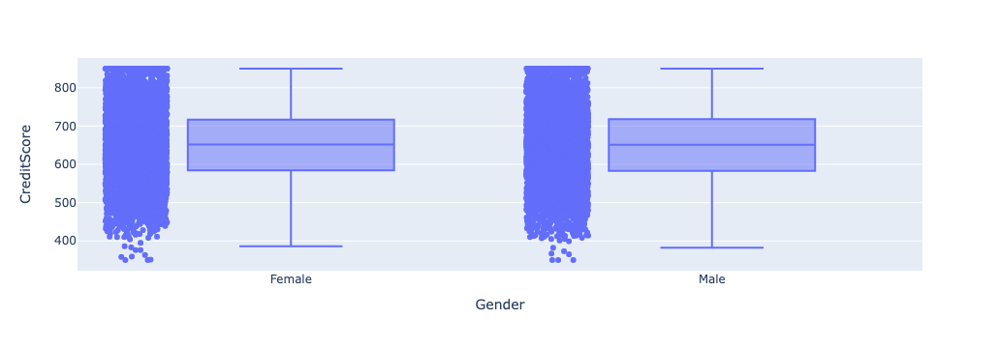

France Age  : 
count    5014.000000
mean       38.511767
std        10.469459
min        18.000000
25%        31.000000
50%        37.000000
75%        43.000000
max        92.000000
Name: Age, dtype: float64


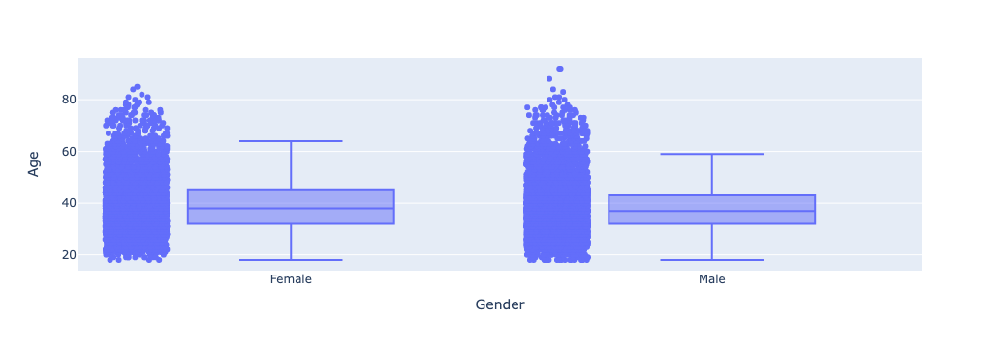

France Tenure  : 
count    5014.000000
mean        5.015556
std         2.820686
min         0.000000
25%         3.000000
50%         5.000000
75%         7.000000
max        10.000000
Name: Tenure, dtype: float64


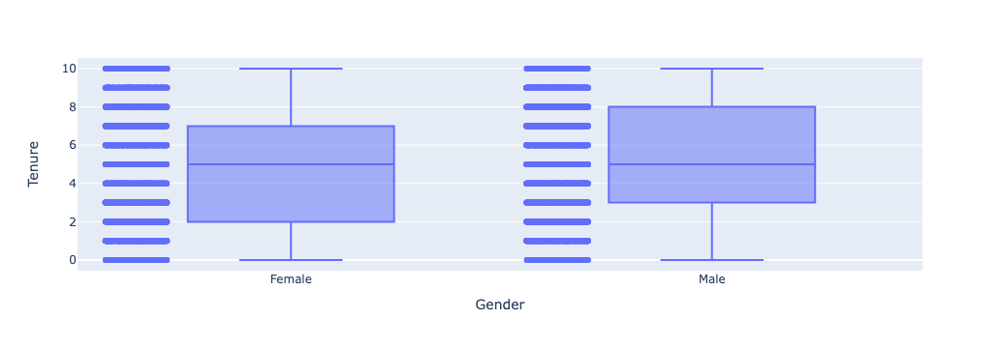

France Balance  : 
count      5014.000000
mean      62092.636516
std       64133.565524
min           0.000000
25%           0.000000
50%       62153.500000
75%      121444.877500
max      238387.560000
Name: Balance, dtype: float64


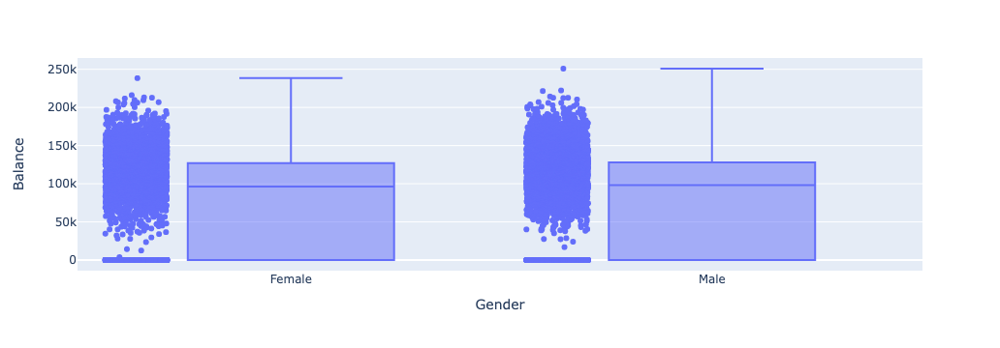

France EstimatedSalary  : 
count      5014.000000
mean      99899.180814
std       57336.289016
min          90.070000
25%       51399.190000
50%       99132.310000
75%      149295.360000
max      199929.170000
Name: EstimatedSalary, dtype: float64


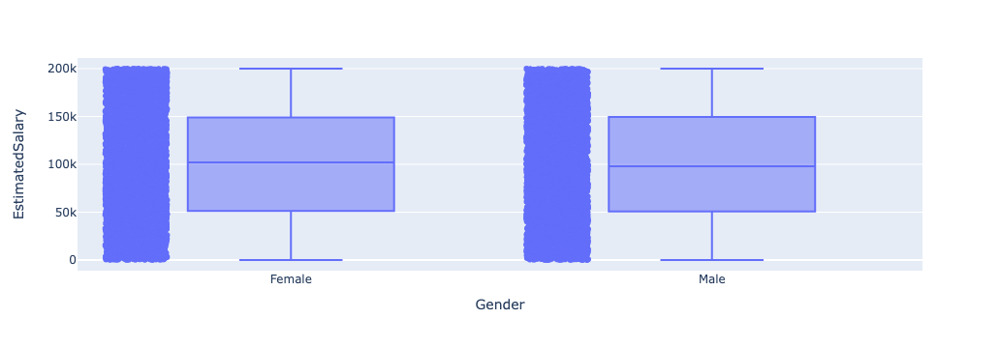

Spain CreditScore  : 
count    2477.000000
mean      651.333872
std        94.365051
min       350.000000
25%       587.000000
50%       651.000000
75%       715.000000
max       850.000000
Name: CreditScore, dtype: float64


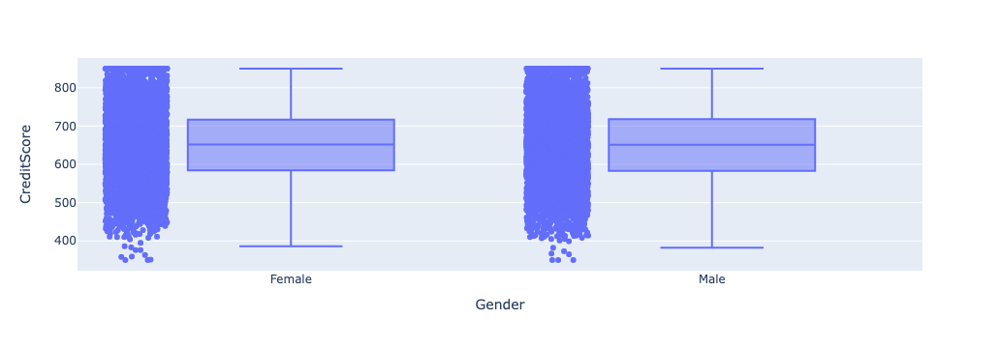

Spain Age  : 
count    2477.000000
mean       38.890997
std        10.446119
min        18.000000
25%        32.000000
50%        37.000000
75%        44.000000
max        88.000000
Name: Age, dtype: float64


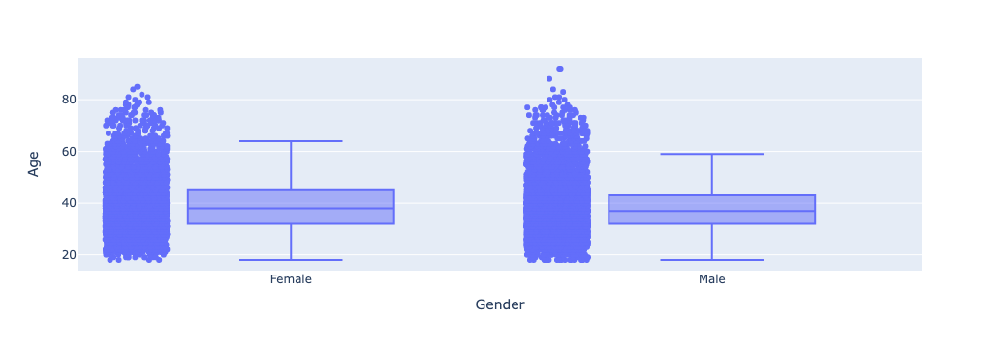

Spain Tenure  : 
count    2477.000000
mean        5.156641
std         2.803415
min         0.000000
25%         3.000000
50%         5.000000
75%         8.000000
max        10.000000
Name: Tenure, dtype: float64


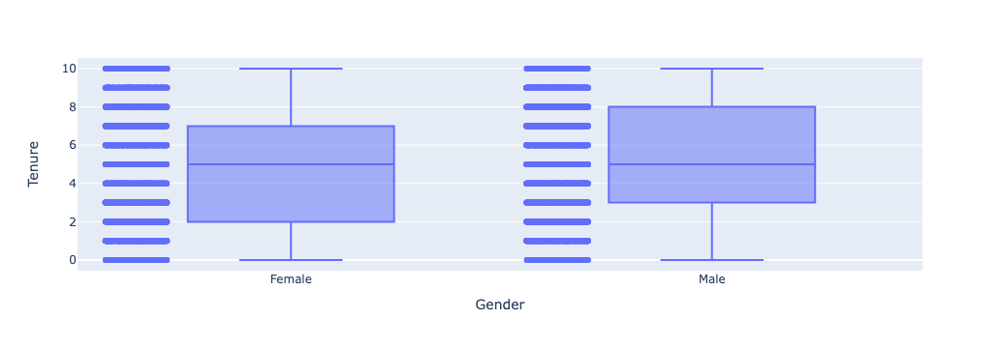

Spain Balance  : 
count      2477.000000
mean      61818.147763
std       64235.555208
min           0.000000
25%           0.000000
50%       61710.440000
75%      121056.630000
max      250898.090000
Name: Balance, dtype: float64


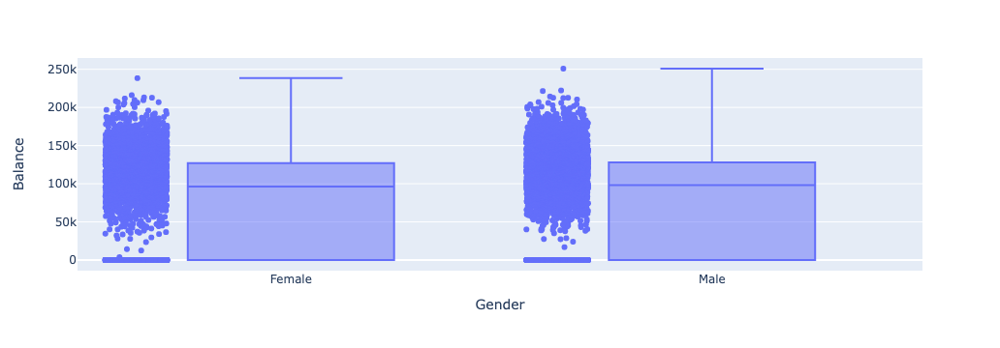

Spain EstimatedSalary  : 
count      2477.000000
mean      99440.572281
std       57103.678091
min         417.410000
25%       50267.690000
50%       99984.860000
75%      147278.430000
max      199992.480000
Name: EstimatedSalary, dtype: float64


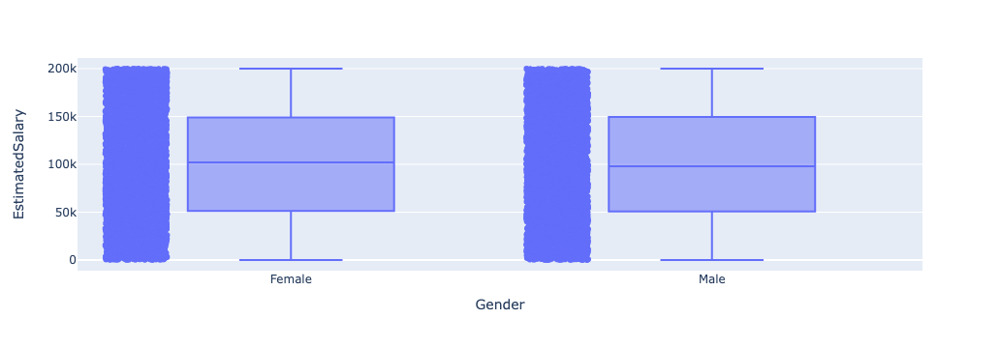

Germany CreditScore  : 
count    2509.000000
mean      651.453567
std        98.168937
min       350.000000
25%       584.000000
50%       651.000000
75%       722.000000
max       850.000000
Name: CreditScore, dtype: float64


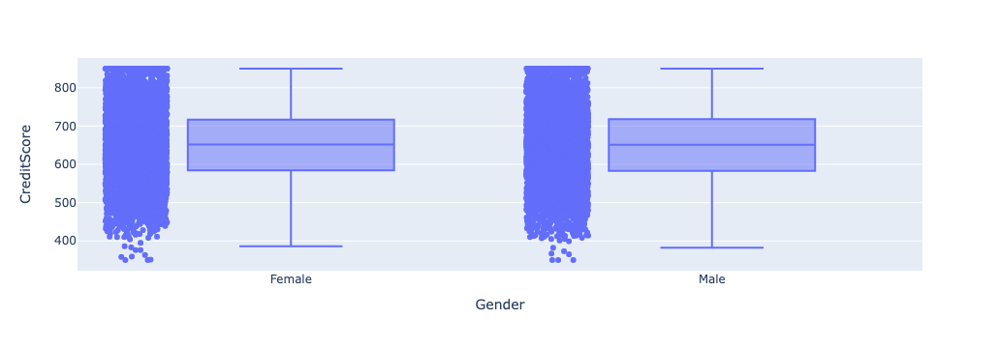

Germany Age  : 
count    2509.000000
mean       39.771622
std        10.519143
min        18.000000
25%        32.000000
50%        38.000000
75%        45.000000
max        84.000000
Name: Age, dtype: float64


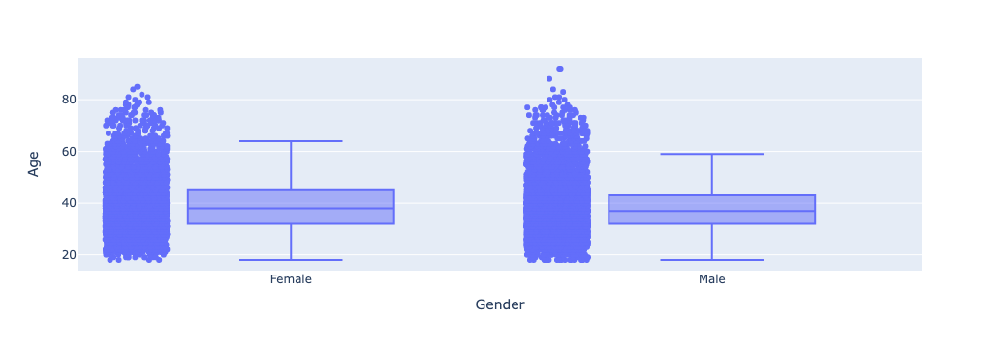

Germany Tenure  : 
count    2509.000000
mean        4.982862
std         3.043168
min         0.000000
25%         2.000000
50%         5.000000
75%         8.000000
max        10.000000
Name: Tenure, dtype: float64


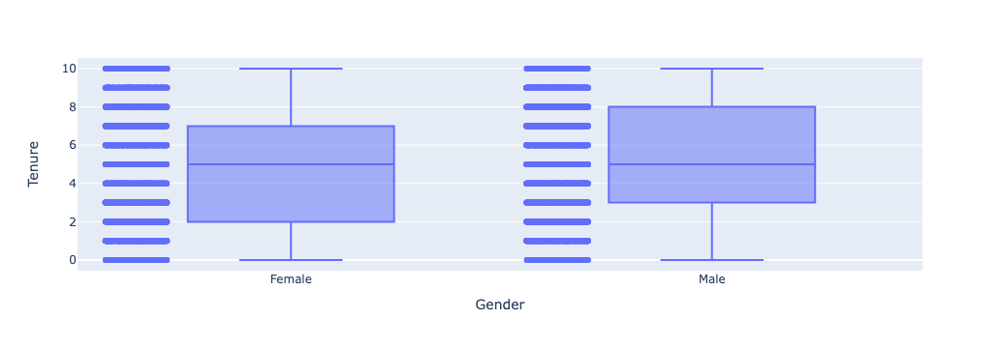

Germany Balance  : 
count      2509.000000
mean     119730.116134
std       27022.006157
min       27288.430000
25%      102800.720000
50%      119703.100000
75%      137560.380000
max      214346.960000
Name: Balance, dtype: float64


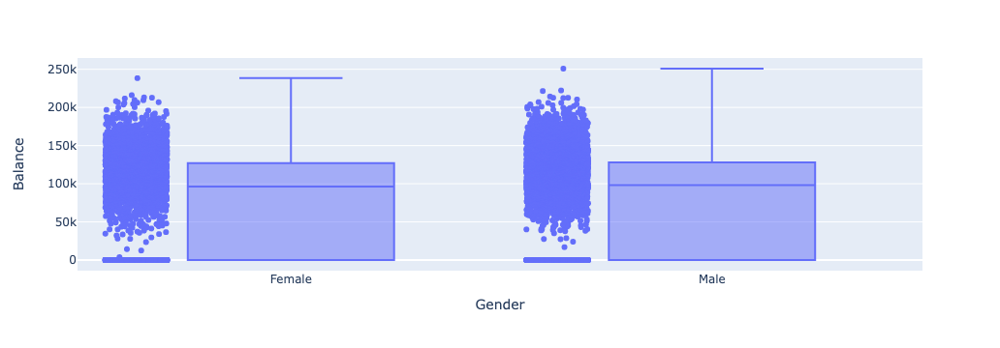

Germany EstimatedSalary  : 
count      2509.000000
mean     101113.435102
std       58263.011501
min          11.580000
25%       51016.020000
50%      102397.220000
75%      151083.800000
max      199970.740000
Name: EstimatedSalary, dtype: float64


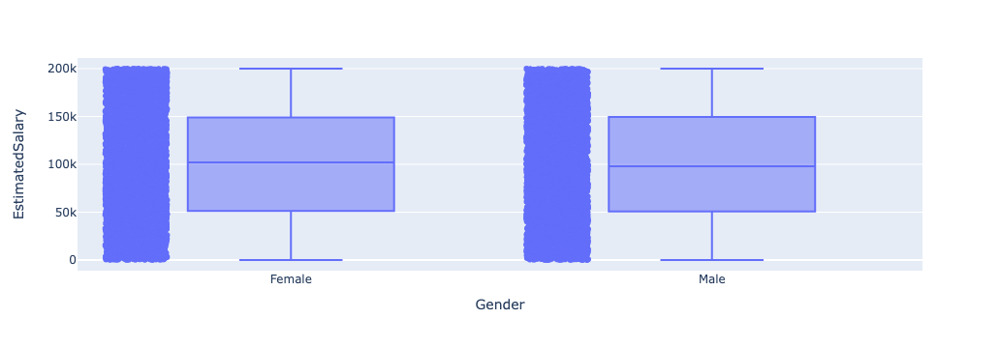

In [36]:
for geo in data['Geography'].unique():
    for feature in real_features:
        print(geo, feature," : ")
        print(data.query('Geography == @geo')[feature].describe())
        fig = px.box(data, y=feature, points='all', x='Gender')
        fig.show()

После анализа диаграм размаха можно заметить следущее:
- клиенты во Франции и Испании во многом похожи между собой по своим потребительским качестваи (например медианные значения стообца `Balance`)
- Для всех географий можно наблюдать что значительное количество данных для стобце `EstimatedSalary` находится ниже официально установеднной з/п (считаем что данные в столбце представляют з/п за год). В данном стобце присутсвует значительное количество значений которые можно классифициировать как выбросы или как неправильно введеённые данные (например з/п в час или в неделею или в месяц). Но так как неясно что с ними делать оставим как есть - определённое количество шума или ошибок не будет лишним.

Посмотри на корреляцию признаков

In [37]:
data[real_features].corr()

,CreditScore,Age,Tenure,Balance,EstimatedSalary
CreditScore,1.000000,-0.003965,0.004633,0.006268,-0.001384
Age,-0.003965,1.000000,-0.015801,0.028308,-0.007201
Tenure,0.004633,-0.015801,1.000000,-0.012418,0.005054
Balance,0.006268,0.028308,-0.012418,1.000000,0.012797
EstimatedSalary,-0.001384,-0.007201,0.005054,0.012797,1.000000


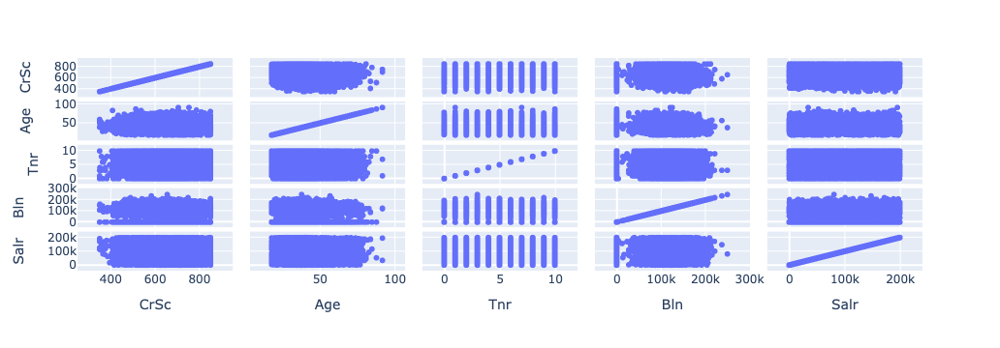

In [38]:
labels = {'Age': 'Age',
          'CreditScore': 'CrSc',
          'Tenure': 'Tnr',
          'Balance': 'Bln',
          'EstimatedSalary': 'Salr',
         }
fig = px.scatter_matrix(data, dimensions=real_features, labels=labels)
fig.show()

Не наблюдается значимой коррелции между вещественными признаками

### Промежуточные итоги: Исследование данных
1. Наблюдается серьёзный дисбаланс между классами в пользу класса `0`.

2. Из гистограм категориальных признаков можем заметить следущее:
   - Данные столбца `Geography` для значения `France` почти в 2 раза привышают остальные значения.
   - В столбце `NumOfProducts` значения `3` и `4` практически не представлены. Количество данных для значений `1` и `2` на порядок превышает соличество данных для `3` и `4`.
   - В стообце `HasCrCard` количество данных для значения `1` почти в 2 раза превышает количество данных для знаяения `0`.
   
3. После анализа диаграм размаха можно заметить следущее:
- клиенты во Франции и Испании во многом похожи между собой по своим потребительским качестваи (например медианные значения стообца `Balance`)
- Для всех географий можно наблюдать что значительное количество данных для стобце `EstimatedSalary` находится ниже официально установеднной з/п (считаем что данные в столбце представляют з/п за год). В данном стобце присутсвует значительное количество значений которые можно классифициировать как выбросы или как неправильно введеённые данные (например з/п в час или в неделею или в месяц). Но так как неясно что с ними делать оставим как есть - определённое количество шума или ошибок не будет лишним.

4. Не наблюдается значимой коррелции между вещественными признаками

## Подготовка признаков

На данном шаге мы выполним следущие задачи:
- Кодирование категориальных признаков
- Разбиение выборки на обучающую и валидационную
- Стандартизацию вещественных признаков

Выполним кодирование категориальных признаков

In [39]:
data.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'Exited'],
      dtype='object')

In [40]:
real_features

['CreditScore', 'Age', 'Tenure', 'Balance', 'EstimatedSalary']

In [41]:
data.dtypes

CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

Нам нужно выполнить кодирование признаков `Geography` и `Gender`, так как они представалены типом данных `object`

In [42]:
data_ohe = pd.get_dummies(data)

Подготовим необходимые для обучения и тестирования выборки

In [43]:
target_ohe = data_ohe['Exited']
features_ohe = data_ohe.drop('Exited', axis=1)

In [44]:
features_train_ohe, features_valid_ohe, target_train_ohe, target_valid_ohe = train_test_split(features_ohe,
                                                                                              target_ohe,
                                                                                              test_size=0.25,
                                                                                              random_state=12345,
                                                                                             )

In [45]:
print(features_train_ohe.shape)
print(target_train_ohe.shape)
print(features_valid_ohe.shape)
print(target_valid_ohe.shape)

(7500, 13)
(7500,)
(2500, 13)
(2500,)


Теперь у нас есть все необходимые наборы данных для обучения как логистической регрессией так и древесными методами

Выполним стандратизацию вещественных признаков

Перед нормализацией оценим нормальность распределения вещественных признаков

In [46]:
data.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'Exited'],
      dtype='object')

In [47]:
real_features

['CreditScore', 'Age', 'Tenure', 'Balance', 'EstimatedSalary']

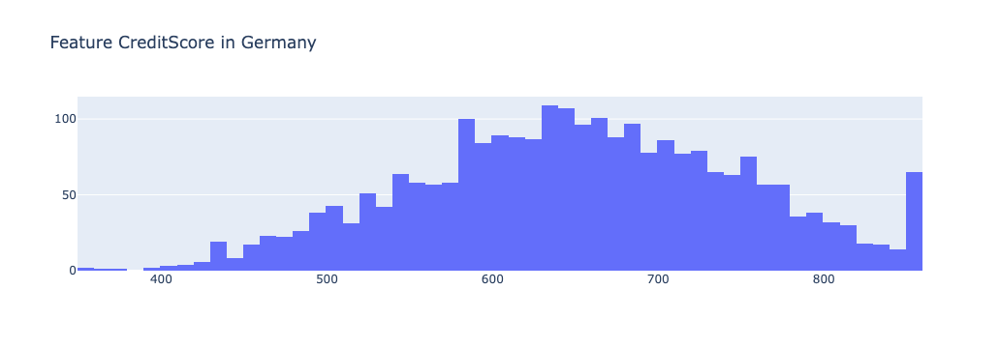

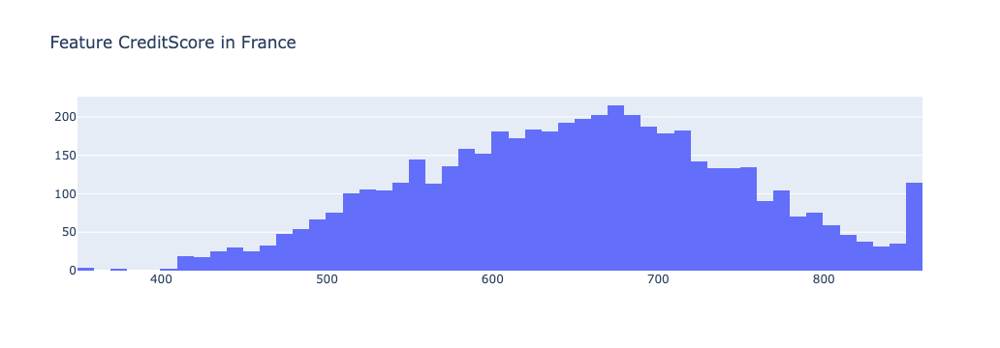

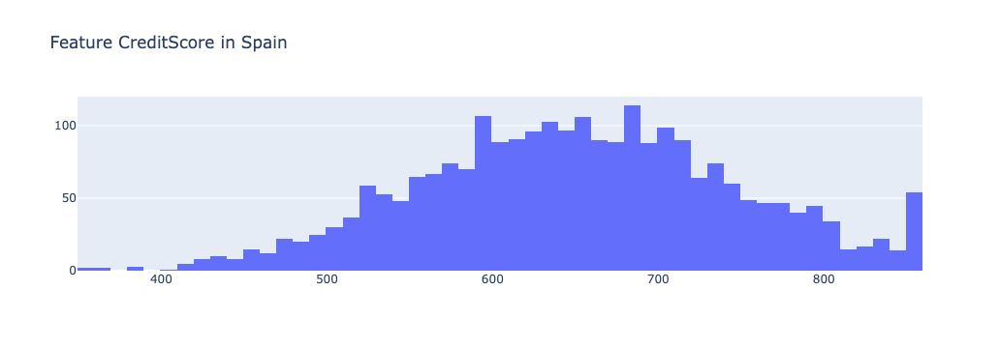

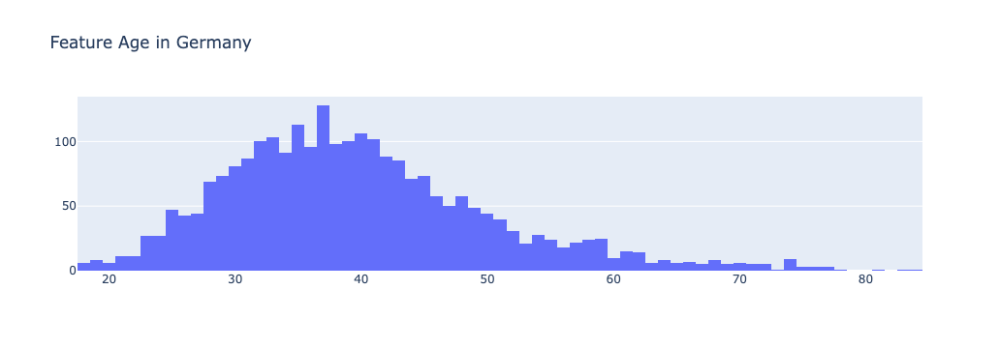

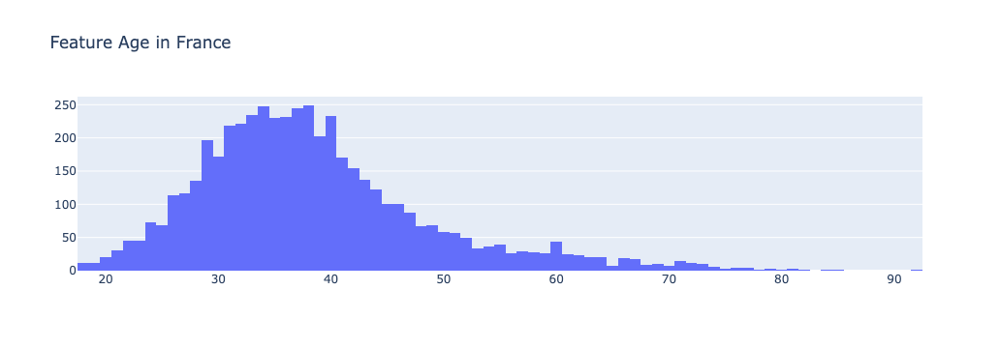

...

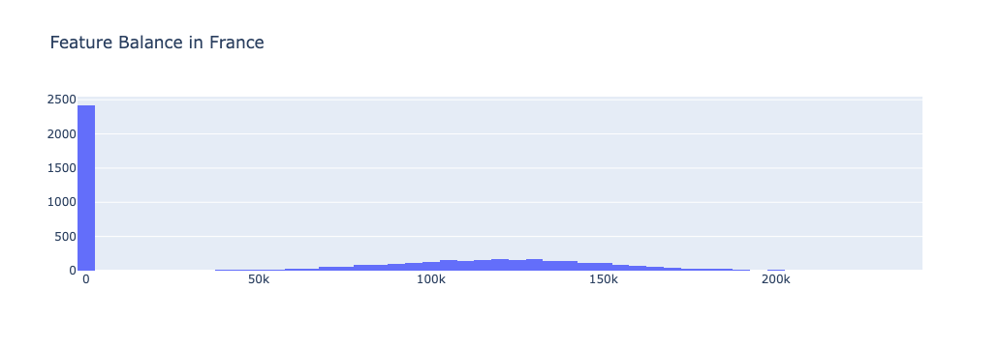

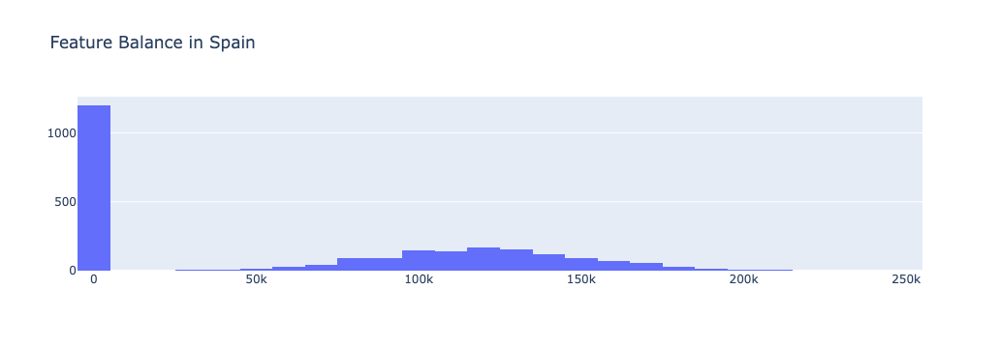

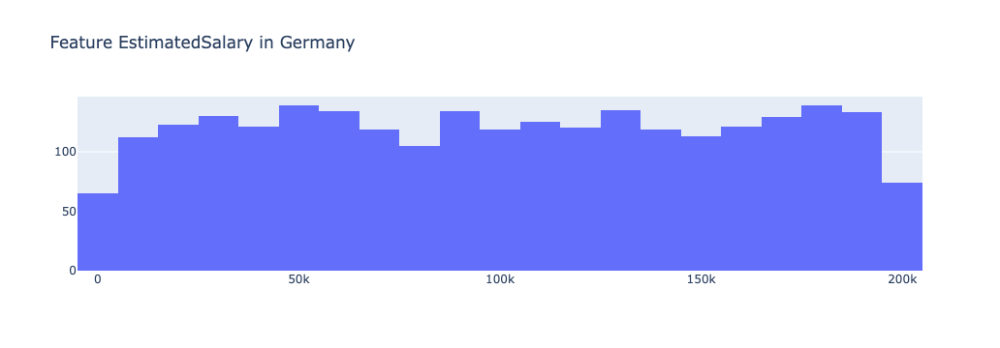

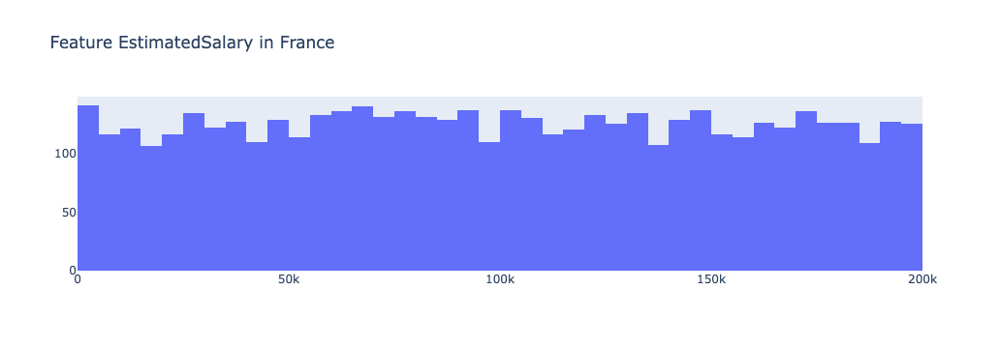

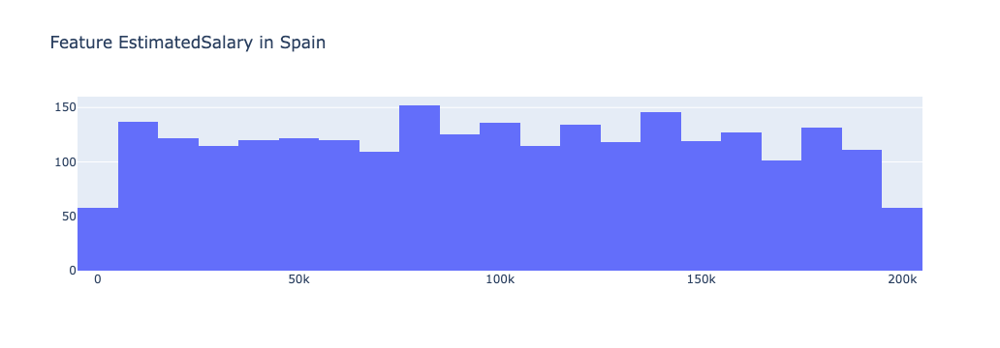

In [48]:
for feature in real_features:
    x0 = data.query("Geography == 'Germany'")[feature]
    fig = go.Figure(data=[go.Histogram(x=x0)])
    fig.update_layout(
        title_text='Feature {feature} in Germany'.format(feature=feature), # title of plot
    )
    fig.show()
    
    x1 = data.query("Geography == 'France'")[feature]
    fig = go.Figure(data=[go.Histogram(x=x1)])
    fig.update_layout(
        title_text='Feature {feature} in France'.format(feature=feature), # title of plot
    )
    fig.show()
    
    x2 = data.query("Geography == 'Spain'")[feature]
    fig = go.Figure(data=[go.Histogram(x=x2)])
    fig.update_layout(
        title_text='Feature {feature} in Spain'.format(feature=feature), # title of plot
    )
    fig.show()

В принципе можно утверждать что все вещественные призанки имеют свойства нормального распределения

Теперь выполним собственно нормализацию вещественных признаков

In [49]:
pd.options.mode.chained_assignment = None

In [50]:
scaler = StandardScaler()

In [51]:
scaler.fit(features_train_ohe[real_features])

StandardScaler()

In [52]:
features_train_ohe[real_features] = scaler.transform(features_train_ohe[real_features])
features_valid_ohe[real_features] = scaler.transform(features_valid_ohe[real_features])

In [53]:
features_train_ohe.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
226,0.442805,-0.841274,1.369543,-1.224577,2,1,1,-1.269750,1,0,0,1,0
7756,-0.310897,-0.270730,0.672575,0.641783,1,1,1,0.960396,0,0,1,1,0
2065,-0.259274,-0.556002,1.021059,-1.224577,2,1,0,0.661864,1,0,0,0,1
2800,1.217157,1.155631,1.369543,1.290462,2,1,0,-1.039476,1,0,0,0,1
7028,0.690598,-1.221637,1.369543,1.142121,1,0,0,-0.851729,0,1,0,0,1


### Промежуточные итоги: Подготовка признаков

- Выполнено кодирование категориальных признаков по методу OHE
- Успешно подговили все необходимые наборы данных для обучения как логистической регрессией так и древесными методами
- Проыели оценку нормальности распределений вещественных признаков
- Выполниили стандартизацию вещественных признаков

## Построение моделей без учёта дисбаланса классов

In [54]:
model = LogisticRegression(solver='liblinear', penalty='elasticnet', random_state=12345)
model.fit(features_train_ohe, target_train_ohe)
predicted_valid = model.predict(features_valid_ohe)
accuracy_valid = accuracy_score(target_valid_ohe, predicted_valid)
f1_valid = f1_score(target_valid_ohe, predicted_valid)
print(accuracy_valid)
print(f1_valid)

0.798
0.29567642956764295


In [55]:
model = DecisionTreeClassifier(random_state=12345, max_depth=5)
model.fit(features_train_ohe, target_train_ohe)
predicted_valid = model.predict(features_valid_ohe)
accuracy_valid = accuracy_score(target_valid_ohe, predicted_valid)
f1_valid = f1_score(target_valid_ohe, predicted_valid)
print(accuracy_valid)
print(f1_valid)

0.7828
0.4939422180801491


In [ ]:
model = RandomForestClassifier(random_state=12345, n_estimators=1000)
model.fit(features_train_ohe, target_train_ohe)
predicted_valid = model.predict(features_valid_ohe)
accuracy_valid = accuracy_score(target_valid_ohe, predicted_valid)
f1_valid = f1_score(target_valid_ohe, predicted_valid)
print(accuracy_valid)
print(f1_valid)

0.8516
0.558858501783591


### Промежуточные итоги: построение моделей без учёта дисбаланса классов

Для построения моделей мы использовали следущие алгоритмы обучения:
- LogisticRegression
- DecisionTreeClassifier
- RandomForestClassifier

При тестировании готовых моделей были достигнуты следущие результаты меры F1:
- LogisticRegression: 0.2932960893854748
- DecisionTreeClassifier: 0.48022079116835326
- RandomForestClassifier: 0.5680473372781064

Без решения проблемы балансировки кллассов целевой проектный показатель меры F1 не был достигнут.

## Решение проблемы дисбаланса классов

На данном этапе будут выполнены следующие задачи:
- Протестирован параметр `class_weight` при построении моделей
- Применение метода upsample
- Применение метода downsample
- Выброчное применение методов ребалансировки данных из библиотеки `imbalanced-learn`

In [57]:
target_train_ohe.value_counts()

0    5998
1    1502
Name: Exited, dtype: int64

In [58]:
1502 / 5992

0.2506675567423231

Протестируем параметр `class_weight`

In [59]:
class_weight = {1: 0.8,
                0: 0.2,
               }

In [60]:
model = LogisticRegression(random_state=12345, class_weight='balanced', solver='liblinear')

In [61]:
model.fit(features_train_ohe, target_train_ohe)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.5114709851551956


In [62]:
model = DecisionTreeClassifier(random_state=12345, class_weight=class_weight)

In [63]:
model.fit(features_train_ohe, target_train_ohe)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.502868068833652


In [64]:
model = RandomForestClassifier(random_state=12345, class_weight=class_weight)

In [65]:
model.fit(features_train_ohe, target_train_ohe)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.5580838323353293


Применение параметра `class_weight` не позволило достичь целевого проектного показателя меры F1

Применим метод `upsampling`

In [66]:
def upsample(features, target, repeat):
    features_zeros = features[target == 0]
    features_ones = features[target == 1]
    target_zeros = target[target == 0]
    target_ones = target[target == 1]

    features_upsampled = pd.concat([features_zeros] + [features_ones] * repeat)
    target_upsampled = pd.concat([target_zeros] + [target_ones] * repeat)
    
    features_upsampled, target_upsampled = shuffle(
        features_upsampled, target_upsampled, random_state=12345)
    
    return features_upsampled, target_upsampled

In [67]:
mult_fact = 4

In [68]:
features_upsampled, target_upsampled = upsample(features_train_ohe, target_train_ohe, mult_fact)

In [69]:
features_upsampled.shape

(12006, 13)

In [70]:
features_train_ohe.shape

(7500, 13)

In [76]:
model = LogisticRegression(random_state=12345, solver='liblinear', class_weight='balanced')

In [77]:
model.fit(features_upsampled, target_upsampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.5114709851551956


In [78]:
model = DecisionTreeClassifier(random_state=12345)

In [79]:
model.fit(features_upsampled, target_upsampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.504265402843602


In [80]:
model = RandomForestClassifier(random_state=12345, class_weight='balanced')

In [81]:
model.fit(features_upsampled, target_upsampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.6113989637305699


Построим модели без балансировки классов

In [82]:
model = LogisticRegression(random_state=12345, solver='liblinear')

In [83]:
model.fit(features_upsampled, target_upsampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.5111260957518544


In [84]:
model = RandomForestClassifier(random_state=12345)

In [85]:
model.fit(features_upsampled, target_upsampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.6059365404298874


In [86]:
accuracy_valid = accuracy_score(target_valid_ohe, predicted_valid)
print('Accuracy:', accuracy_valid)

Accuracy: 0.846


Применение метода `upsampling` позводило достичь целевого проектного показателя меры F1 для алгоритма RandomForestClassifier

Применим метода downsample

In [87]:
def downsample(features, target, fraction):
    features_zeros = features[target == 0]
    features_ones = features[target == 1]
    target_zeros = target[target == 0]
    target_ones = target[target == 1]

    features_downsampled = pd.concat(
        [features_zeros.sample(frac=fraction, random_state=12345)] + [features_ones])
    target_downsampled = pd.concat(
        [target_zeros.sample(frac=fraction, random_state=12345)] + [target_ones])
    
    features_downsampled, target_downsampled = shuffle(
        features_downsampled, target_downsampled, random_state=12345)
    
    return features_downsampled, target_downsampled

In [88]:
fraction = 0.5

In [89]:
features_downsampled, target_downsampled = downsample(features_train_ohe, target_train_ohe, fraction)

In [90]:
features_train_ohe.shape

(7500, 13)

In [91]:
features_downsampled.shape

(4501, 13)

In [92]:
model = LogisticRegression(random_state=12345, solver='liblinear')

In [93]:
model.fit(features_downsampled, target_downsampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.45959104186952293


In [94]:
model = DecisionTreeClassifier(random_state=12345, class_weight='balanced')

In [95]:
model.fit(features_downsampled, target_downsampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.5004061738424046


In [96]:
model = RandomForestClassifier(random_state=12345, class_weight='balanced')

In [97]:
model.fit(features_downsampled, target_downsampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.6134371957156768


In [98]:
accuracy_valid = accuracy_score(target_valid_ohe, predicted_valid)
print('Accuracy:', accuracy_valid)

Accuracy: 0.8412


### Выборочное применение других методов ребалнсировки данных

Применим алгоритм `SMOTE` для выполнения `oversmapling` 

In [87]:
smt = SMOTE(random_state=12345, sampling_strategy='minority', k_neighbors=40)
X_resampled, y_resampled = smt.fit_resample(features_train_ohe, target_train_ohe)

In [88]:
model = RandomForestClassifier(random_state=12345)

In [89]:
model.fit(X_resampled, y_resampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.6109022556390977


In [90]:
target_model_os = model

`SMOTE` позволил несколько улучшить показатель F1 по сравнению с нашим начальным oversample подходом

Применим алгоритм `CondensedNearestNeighbour` для выполнкения `downsample`

In [91]:
smt = CondensedNearestNeighbour(random_state=12345, sampling_strategy='majority')
X_resampled, y_resampled = smt.fit_resample(features_train_ohe, target_train_ohe)

In [92]:
model.fit(X_resampled, y_resampled)
predicted_valid = model.predict(features_valid_ohe)
print("F1:", f1_score(target_valid_ohe, predicted_valid))

F1: 0.610586011342155


In [93]:
target_model = model

`CondensedNearestNeighbour` позволил несколько улучшить показатель F1 по сравнению с нашим начальным downsample подходом

### Промежуточные выводы: Решение проблемы дисбаланса классов

1. Применение параметра `class_weight` хотя и позволило улучшить значение меры F1, не позволило достичь целевого проектного показателя:
    
- LogisticRegression:
     - `class_wright = balanced`,  F1 = 0.5114709851551956
    
- DecisionTreeClassifier: 
     - `class_weight = {1: 0.8, 0: 0.2}`, F1 = 0.5
     
- RandomForestClassifier: 
     -  `class_weight = {1: 0.8, 0: 0.2}`, F1 = 0.5741399762752076
     
*Приведённые выше значения параметра `class_weight` дают оптимальные значения мерв F1 при текущей конфигурации данных и гиперпатаметров алгоритмов обучения**

2. Применние метода `upsampling`:

- LogisticRegression:
     - `class_wright = balanced`,  F1 = 0.5114709851551956
    
- DecisionTreeClassifier: 
     - `class_weight = None`, F1 = 0.50332383665717
     
- RandomForestClassifier: 
     -  `class_weight = balanced`, F1 = 0.6164948453608248
     
     
Оптимальный фактор увеличения - 4

**Применние метода `upsampling` позводило достичь и превысить целевой проектный показатель меры F1 для алгоритма RandomForestClassifier**

3.  Применние метода `downsampling`:

- LogisticRegression:
     - `class_weight = None`,  F1 = 0.45959104186952293
    
- DecisionTreeClassifier: 
     - `class_weight = balanced`, F1 = 0.49550286181520853
     
- RandomForestClassifier: 
     -  `class_weight = balanced`, F1 = 0.6181818181818182
     
     
Оптимальный фактор уменьшения - 0.5

**Применние метода `downsampling` позводило достичь и превысить целевой проектный показатель меры F1 для алгоритма RandomForestClassifier. Также метод downsample позволил достичь незначительно лучшего значения меры F1**

4. Выборочное применение других методов ребалнсировки данных:

- `SMOTE` позволил несколько улучшить показатель F1 по сравнению с нашим начальным oversample подходом:
    0.6178403755868545 (было достигнуто также 0.6221335992023929) vs 0.6164948453608248
    
- `CondensedNearestNeighbour` позволил несколько улучшить показатель F1 по сравнению с нашим начальным downsample подходом:
    F1: 0.6190885640584695 vs 0.6181818181818182
    
**В качестве алгоритма обучения использовалсяс только случайный лес, как наиболее качественный алгоритм**

## Оценка адекватности целевой модели

На данном этапе мы выполним оценку адекватности целевой модели сравнив показатель `accuracy`  для `DummyClassifier` и для целевых моделей построенных после ребалнсировки

In [94]:
dummy_clf = DummyClassifier(strategy="most_frequent")

In [95]:
dummy_clf.fit(X_resampled, y_resampled)

DummyClassifier(strategy='most_frequent')

In [96]:
predicted_valid = dummy_clf.predict(features_valid_ohe)

In [97]:
accuracy_valid = accuracy_score(target_valid_ohe, predicted_valid)
print('Accuracy:', accuracy_valid)

Accuracy: 0.786


Протестируем модель построенную методом `downsample`

In [98]:
predicted_valid = target_model.predict(features_valid_ohe)

In [99]:
accuracy_valid = accuracy_score(target_valid_ohe, predicted_valid)
print('Accuracy:', accuracy_valid)

Accuracy: 0.8352


Протестируем модель построенную методом `oversample`

In [100]:
predicted_valid = target_model_os.predict(features_valid_ohe)

In [101]:
accuracy_valid = accuracy_score(target_valid_ohe, predicted_valid)
print('Accuracy:', accuracy_valid)

Accuracy: 0.8352


### Промежуточные выводы: Оценка адекватности целевой модели

Целевые модели показали лучшие результаты чем `DummyClassifier`, можем признать наши модели адекватными

## Исследование метрики AUC-ROC

На данном этапе проведём исследования метрики AUC-ROC

In [102]:
probas_valid = target_model.predict_proba(features_valid_ohe)

In [103]:
probas_one_valid = probas_valid[:, 1]

In [104]:
fpr, tpr, thresholds = roc_curve(target_valid_ohe, probas_one_valid)

In [105]:
auc_roc = roc_auc_score(target_valid_ohe, probas_one_valid)

In [106]:
print(auc_roc)

0.8421901976171792


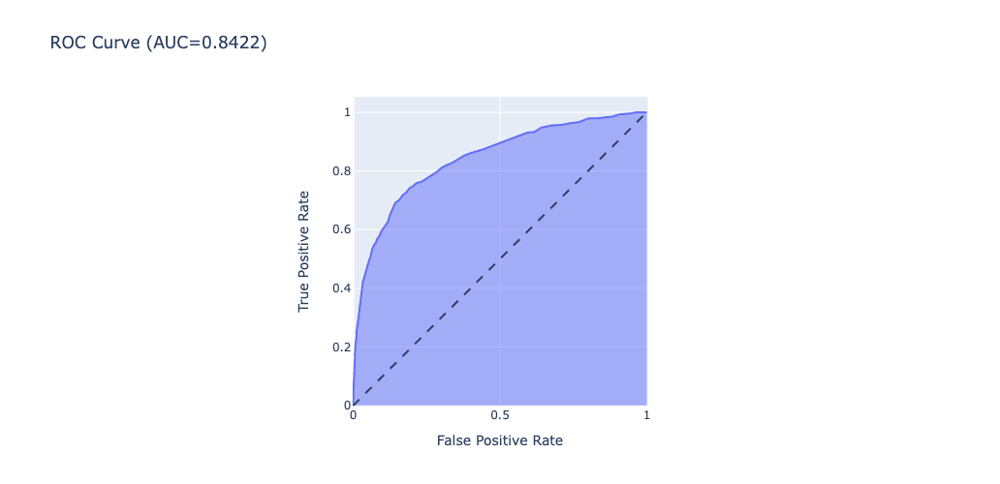

In [107]:
fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

### Промежуточные выводы: Исследование метрики AUC-ROC

- Кривая ROC нашей целевой модели тяготеет к 'идеальному' левому верхнему углу и соотвественно демонстрирует приемлемое качество работы модели.

## Общий вывод

**Подготовка данных**

    - Данные загрузились штатно, со стандартными параметрами, проблем при чтении не обнаружено.

    - При первичном исследовании данных обнаружиди следущие проблемы:
 
       - Столбец `Tenure`:
       - есть пропуски (заполгили наиболее частыми значениями для групп `Geography` & `Gender`)
       - `float64` видимо не соотвествует используемым знеачениям: заменили на `int64`
    
    
    - Также удалили следущие столбцы как безперспективные для нашей задачи:    
      1. Столбец `RowNumber`
        - не очевидна полезность данного стообца для дальнейшего анализа, искоючим его из набора данных
   
      2. Столбец `CustomerId`
        - не очевидна полезность данного стообца для дальнейшего анализа, искоючим его из набора данных
   
      3. Столбец `Surname`
        - не очевидна полезность данного стообца для дальнейшего анализа, искоючим его из набора данных
   
        - Не обнаружено прямых дубликатов до и после удаления стообцов

**Исследование данных**

    1. Наблюдается серьёзный дисбаланс между классами в пользу класса `0`.

    2. Из гистограм категориальных признаков можем заметить следущее:
      - Данные столбца `Geography` для значения `France` почти в 2 раза привышают остальные значения.
      - В столбце `NumOfProducts` значения `3` и `4` практически не представлены. Количество данных для значений `1` и `2` на порядок превышает соличество данных для `3` и `4`.
      - В стообце `HasCrCard` количество данных для значения `1` почти в 2 раза превышает количество данных для знаяения `0`.
   
    3. После анализа диаграм размаха можно заметить следущее:
     - клиенты во Франции и Испании во многом похожи между собой по своим потребительским качестваи (например медианные значения стообца `Balance`)
     - Для всех географий можно наблюдать что значительное количество данных для стобце `EstimatedSalary` находится ниже официально установеднной з/п (считаем что данные в столбце представляют з/п за год). В данном стобце присутсвует значительное количество значений которые можно классифициировать как выбросы или как неправильно введеённые данные (например з/п в час или в неделею или в месяц). Но так как неясно что с ними делать оставим как есть - определённое количество шума или ошибок не будет лишним.

4. Не наблюдается значимой коррелции между вещественными признаками

**Подготовка признаков**

    - Выполнено кодирование категориальных признаков по методу OHE
    - Успешно подговили все необходимые наборы данных для обучения как логистической регрессией так и древесными методами
    - Проыели оценку нормальности распределений вещественных признаков
    - Выполниили стандартизацию вещественных признаков

**Построение моделей без учёта дисбаланса классов**

    Для построения моделей мы использовали следущие алгоритмы обучения:
     - LogisticRegression
     - DecisionTreeClassifier
     - RandomForestClassifier

    При тестировании готовых моделей были достигнуты следущие результаты меры F1:
     - LogisticRegression: 0.2932960893854748
     - DecisionTreeClassifier: 0.48022079116835326
     - RandomForestClassifier: 0.5680473372781064

    Без решения проблемы балансировки кллассов целевой проектный показатель меры F1 не был достигнут.

**Решение проблемы дисбаланса классов**

    1. Применение параметра `class_weight` хотя и позволило улучшить значение меры F1, не позволило достичь целевого проектного показателя:
    
     - LogisticRegression:
     - `class_wright = balanced`,  F1 = 0.5114709851551956
    
     - DecisionTreeClassifier: 
     - `class_weight = {1: 0.8, 0: 0.2}`, F1 = 0.5
     
     - RandomForestClassifier: 
     -  `class_weight = {1: 0.8, 0: 0.2}`, F1 = 0.5741399762752076
     
     Приведённые выше значения параметра `class_weight` дают оптимальные значения мерв F1 при текущей конфигурации данных и гиперпатаметров алгоритмов обучения

     2. Применние метода `upsampling`:

     - LogisticRegression:
     - `class_wright = balanced`,  F1 = 0.5114709851551956
    
     - DecisionTreeClassifier: 
     - `class_weight = None`, F1 = 0.50332383665717
     
     - RandomForestClassifier: 
     -  `class_weight = balanced`, F1 = 0.6164948453608248
     
     
     Оптимальный фактор увеличения - 4

     Применние метода `upsampling` позводило достичь и превысить целевой проектный показатель меры F1 для алгоритма RandomForestClassifier

     3.  Применние метода `downsampling`:

      - LogisticRegression:
      - `class_weight = None`,  F1 = 0.45959104186952293
    
     - DecisionTreeClassifier: 
     - `class_weight = balanced`, F1 = 0.49550286181520853
     
     - RandomForestClassifier: 
     -  `class_weight = balanced`, F1 = 0.6181818181818182
     
     
     Оптимальный фактор уменьшения - 0.5

     Применние метода `downsampling` позводило достичь и превысить целевой проектный показатель меры F1 для алгоритма RandomForestClassifier. Также метод downsample позволил достичь незначительно лучшего значения меры F1

     4. Выборочное применение других методов ребалнсировки данных:

     - `SMOTE` позволил несколько улучшить показатель F1 по сравнению с нашим начальным oversample подходом:
    0.6178403755868545 (было достигнуто также 0.6221335992023929) vs 0.6164948453608248
    
    - `CondensedNearestNeighbour` позволил несколько улучшить показатель F1 по сравнению с нашим начальным downsample подходом:
    F1: 0.6190885640584695 vs 0.6181818181818182
    
     В качестве алгоритма обучения использовалсяс только случайный лес, как наиболее качественный алгоритм

**Оценка адекватности целевой модели**

    Целевые модели показали лучшие результаты чем `DummyClassifier`, можем признать наши модели адекватными

**Исследование метрики AUC-ROC**

    - Кривая ROC нашей целевой модели тяготеет к 'идеальному' левому верхнему углу и соотвественно демонстрирует приемлемое качество работы модели.